# LAND COVER CLASSIFICATION

##Introduction

<p style='text-align: justify;'> Land cover mapping (LCM) is one of the most commonly performed tasks in agro-environmental and geospatial research, whose domain ranges from physical geographic observations (e.g. information on the crop type, crop area, configuration of buildings, roads, identifying surface water bodies, etc.) to environmental planning [1–3] Classification and mapping land cover using geospatial datasets has become the foundation in illustrating the Earth's complex biophysical systems such as storm-water runoff and watershed hydrology [2]. On the other hand, land cover classification has become a powerful tool in explaining relationships between environmental changes to socio-economic activities [3]. The recent advances in high-end computer programming and the availability of free satellite imageries have brought the data science and remote sensing in the same platform [4]. It is now possible to quickly perform land cover and land use classifications over wider spatiotemporal spectrum using simplified machine learning or deep learning algorithms on powerful cloud computing platforms [2]. However, there are several practical challenges in supervised land cover classification in the field of ecological modeling such as hyperparameter optimization and performance evaluation [4].</p>

### Dataset 

The publicly available [Sundarbans Satellite Imagery](https://github.com/syamkakarla98/Satellite_Imagery_Analysis/tree/main/Data/sundarbans_data) from Shyamnagar upazila of Satkhira district in Bangladesh with coordinates of (89.0799E, 22.1341N & 89.1335E, 22.2930N) which is a part of the Sundarbans satellite data was used in this study [5]. 

In [ ]:
!pip install ipyleaflet  # Interactive maps in the Jupyter notebook
!pip install rasterio # Rasterio is a GDAL and Numpy-based Python library designed to make your work with geospatial raster data more productive, more fun — more Zen.
!pip install  earthpy #EarthPy is a python package that makes it easier to plot and work with spatial raster and vector


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.3 MB 2.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 19.3 MB 3.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.4 MB 2.1 MB/s 
     |████████████████████████████████| 1.0 MB 37.8 MB/s 
     |████████████████████████████████| 16.7 MB 267 kB/s 


In [ ]:

print("Interactive Map for Study Location (the area with red rectange shape)")
from ipyleaflet import Map, Polygon
polygon = Polygon(
    locations=[(22.2929661069689722, 89.0798950195312642), (22.2929661069689722, 89.1334533691406250),
               (22.1341332998903049, 89.1334533691406250),(22.1341332998903049,89.0798950195312642)],
    color="red",
    fill_color="red",
    weight=1
)
myMap=Map(center=[22.2929661069689722, 89.0798950195312642], zoom=9)
myMap.add_layer(polygon)

myMap

Interactive Map for Study Location (the area with red rectange shape)


Map(center=[22.292966106968972, 89.07989501953126], controls=(ZoomControl(options=['position', 'zoom_in_text',…

<p style='text-align: justify;'> The dataset was acquired using the Sentinel-2 Satellite on 27 January 2020 which consists a total of 12 bands with the spectral resolution varying from 10-60 meters. After stacking these imageries into an n-dimensional array the resultant data has the shape of (12, 954, 298). The dataset also contains a ‘ground truth’ data with the shape of (954, 298) which has 6 classes namely water, plants, trees, bare land and geological contents.</p>

### Supervised Algorithm for Classification of Study Location

#### Setting the Environment

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from glob import glob
import numpy as np
from scipy.io import loadmat # MATLAB  format 
import rasterio as rio
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report
from pprint import pprint
import os
import warnings
warnings.filterwarnings("ignore")

---
---
---

# data preparation

## train 

In [ ]:
# Data Directory
os.chdir('/content/drive/MyDrive/project 6/train')

# Read bands
sentinel_bands = glob("*B?*.tiff")
sentinel_bands.sort()

# Composite the bands
l = []
for i in sentinel_bands:
  with rio.open(i, 'r') as f:
    l.append(f.read(1))

# Data as array
arr_st = np.stack(l)
arr_st.shape

(11, 954, 298)

# Ground Truth
<p style='text-align: justify;'> The ground truth of the satellite image is read using the loadmat method from the scipy.io package. The ground truth has 6 classes which include water, plants, trees, bare land, e.t.c which was two-dimensional (954 × 298).</p>

In [ ]:
# Ground Truth
y_data = loadmat('/content/drive/MyDrive/project 6/train/Sundarbands_gt.mat')['gt']
display(y_data)

array([[0, 0, 0, ..., 2, 2, 2],
       [0, 0, 0, ..., 2, 2, 2],
       [0, 0, 0, ..., 2, 2, 2],
       ...,
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2]], dtype=int32)

# Data Visualization
<p style='text-align: justify;'>These Sundarbans data have multiple numbers of bands that contain the data ranging from visible to infrared. So it is hard to visualize the data for humans. By creating an RGB Composite Image makes it easier to understand the data effectively. To plot RGB composite images, we have plot the red, green, and blue bands, which are bands 4, 3, and 2, respectively. Since Python uses a zero-based index system, so we need to subtract a value of 1 from each index. Therefore, the index for the red band is 3, green is 2, and blue is 1.
Let’s see the code to plot the RGB composite image along with the stretch applied.</p>

In [ ]:
%pip install earthpy
import earthpy.plot as ep

import matplotlib.pyplot as plt

## 12 bands visualization

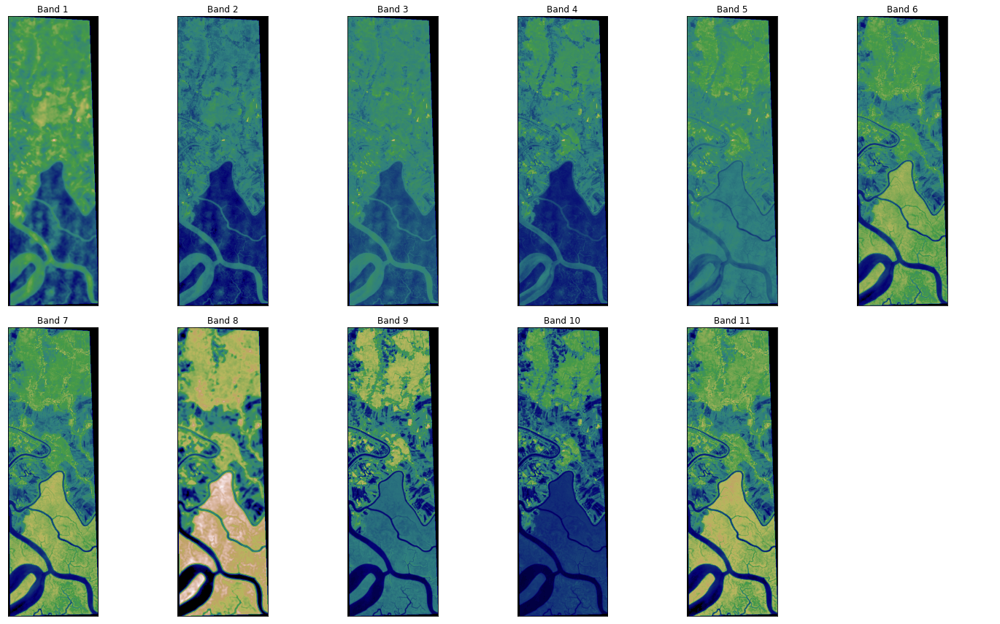

In [ ]:
ep.plot_bands(arr_st, 
              cmap = 'gist_earth', 
              figsize = (20, 12), 
              cols = 6, 
              cbar = False)
plt.show()

##### Data Distribution of all bands

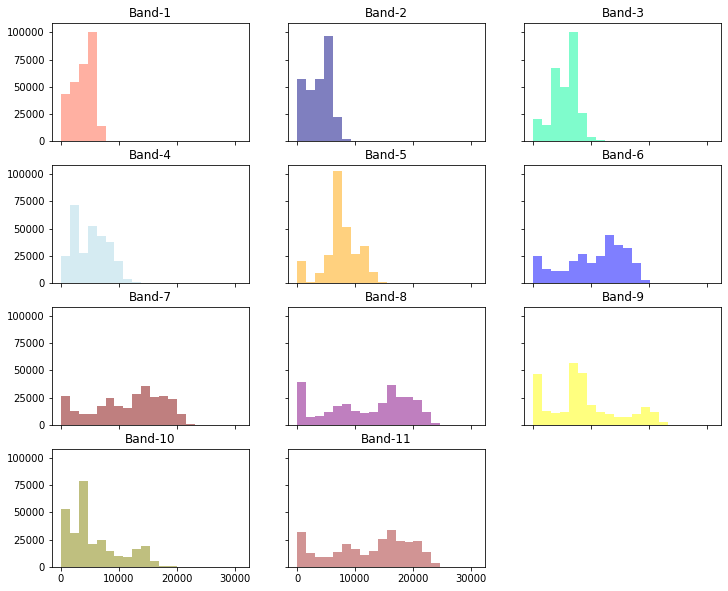

In [ ]:
colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']

ep.hist(arr_st, 
         colors = colors,
        title=[f'Band-{i}' for i in range(1, 12)], 
        cols=3, 
        alpha=0.5, 
        figsize = (12, 10)
        )

plt.show()

##### RGB Composite Image of all bands

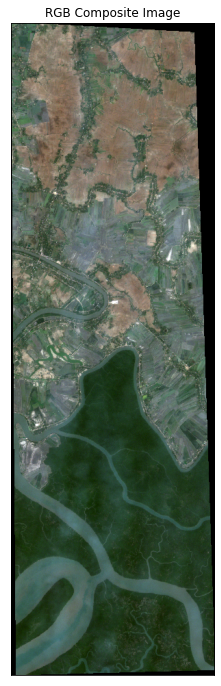

In [ ]:
ep.plot_rgb(
    arr_st,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 12),
    title="RGB Composite Image",
)

plt.show()

## Visualization of the ground truth

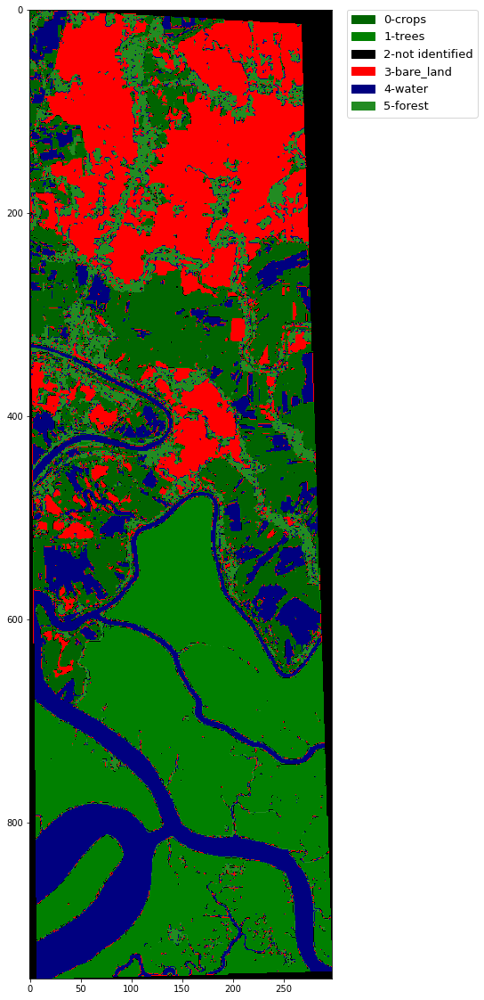

In [ ]:
import numpy as np
import earthpy.plot as ep
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
cat_names = ["0-crops", "1-trees", "2-not identified", "3-bare_land", "4-water", "5-forest"]
f, ax = plt.subplots(figsize=(20, 20))
im_ax = ax.imshow(y_data, cmap=ListedColormap(['darkgreen', 'green', 'black', '#CA6F1E', 'navy', 'forestgreen']))
leg_neg = ep.draw_legend(im_ax = im_ax, titles = cat_names)
plt.show()

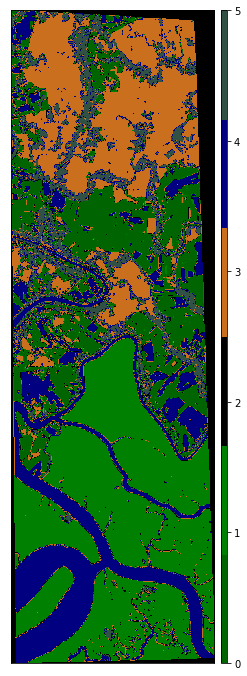

In [ ]:
from matplotlib.colors import ListedColormap
# Visualize Groundtruth
class_name_for_land_cover={0:'trees',1:'plants',2:'not identified',3:'bare_land',4: 'water',5: 'forest'} #not confirmed
ep.plot_bands(y_data, cmap=ListedColormap(['darkgreen', 'green', 'black', '#CA6F1E', 'navy', '#325145']))
plt.show()


## Preprocessing
<p style='text-align: justify'>Standardization is one of the scaling techniques where the values are centered around the mean with a unit standard deviation. This means that the mean of the attribute becomes zero and the resultant distribution has a unit standard deviation. The scaled data is divided into train and test data in the ratio of 80:20. The below code is used to scale and split the data.</p>

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

x = np.moveaxis(arr_st, 0, -1)

X_data = x.reshape(-1, 11)
scaler = StandardScaler().fit(X_data)
X_scaled = scaler.transform(X_data)

# Split data 
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_data.ravel(), 
                                                    test_size=0.20, stratify = y_data.ravel())
print(f"X_train Shape: {X_train.shape}\nX_test Shape: {X_test.shape}\ny_train Shape: {y_train.shape}\ny_test Shape:{y_test.shape}")

X_train Shape: (227433, 11)
X_test Shape: (56859, 11)
y_train Shape: (227433,)
y_test Shape:(56859,)


---
Training the model 
---
---

##  Gradient Boosting Classifier
<p style='text-align:justify'> Gradient boosting is a technique attracting attention for its prediction speed and accuracy, especially with large and complex data. Gradient boosting is a type of supervised machine learning boosting. It relies on the intuition that the best possible next model, when combined with previous models, minimizes the overall prediction error. The key idea is to set the target outcomes for this next model to minimize the error.</p>

# XGB

In [ ]:
from xgboost import XGBClassifier
import xgboost as xgb
xgb_model  = XGBClassifier(max_depth= 8, n_estimators= 200)
xgb_model.fit(X_train, y_train)

xgb_model_pred = xgb_model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, xgb_model_pred)*100}")

print(classification_report(y_test, xgb_model_pred))

Accuracy: 99.1118380555409
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10814
           1       1.00      1.00      1.00     15714
           2       1.00      1.00      1.00      4064
           3       1.00      1.00      1.00     11193
           4       0.99      0.99      0.99      9030
           5       0.97      0.97      0.97      6044

    accuracy                           0.99     56859
   macro avg       0.99      0.99      0.99     56859
weighted avg       0.99      0.99      0.99     56859



## save the  model

In [ ]:
import pickle
pickle.dump(xgb_model, open("/content/drive/MyDrive/project 6/xgb_model_land_GS11.dat", 'wb'))

The (default) Extreme Gradient Boosting Classifier algorithm has shown 99.38% accuracy on the test data.

---
# TESTING WITH OUR SATELLITE IMAGE
---

## load the data 

In [ ]:
# Data Directory
os.chdir('/content/drive/MyDrive/project 6/test/rbi333/R60m')

# Read bands
sentinel_bands = glob("*.jp2")
sentinel_bands.sort()

# Composite the bands
bands_arr = []
for i in sentinel_bands:
  with rio.open(i, 'r') as f:
    g=f.read(1)
    bands_arr.append(g)
    print(i,"has shape",g.shape)
    # Data as array


### preprocessing 

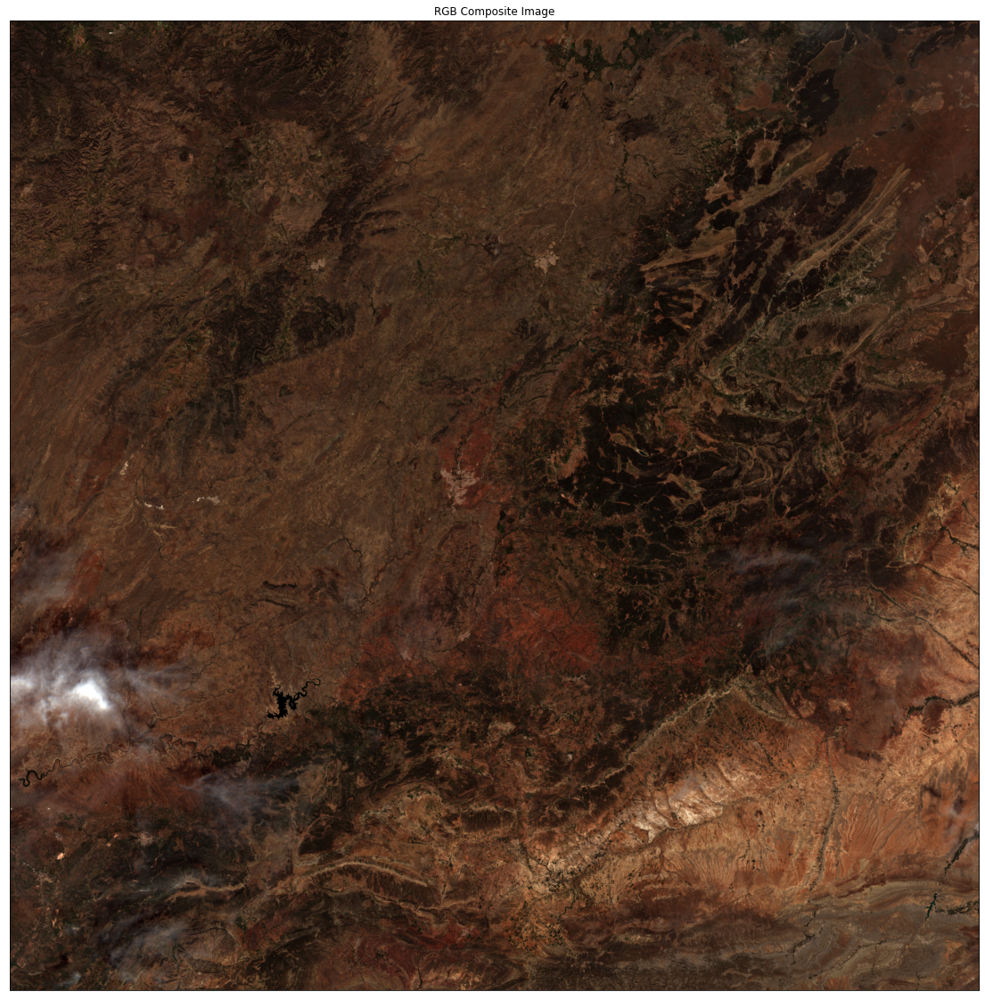

In [ ]:
bands_arr1 = np.stack(bands_arr)
bands_arr1.shape

ep.plot_rgb(
    bands_arr1,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(20, 20),
    title="RGB Composite Image",
)

plt.show()

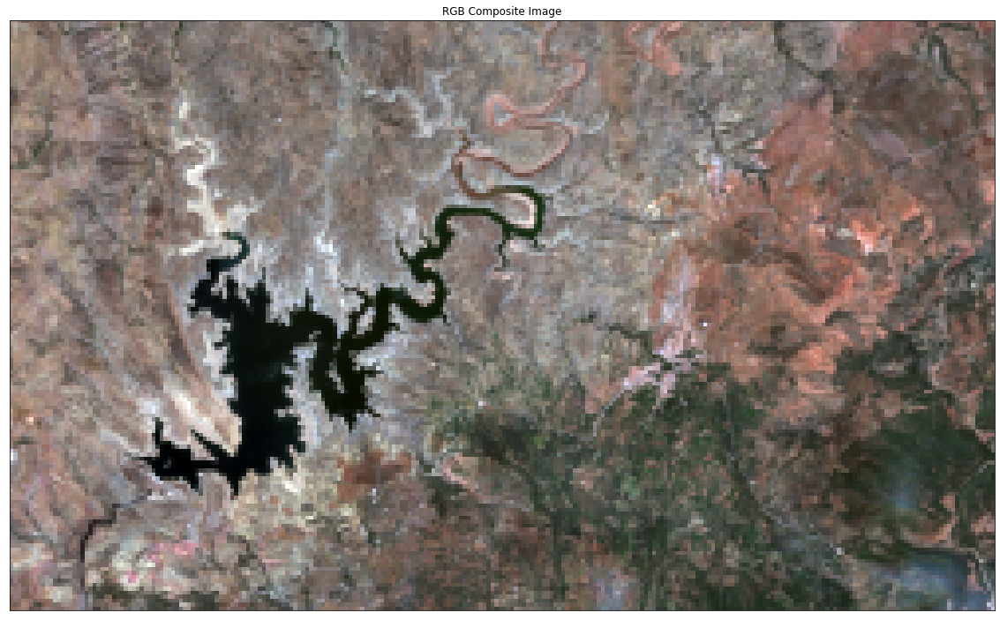

In [ ]:
bands_arr=np.array(bands_arr)
list2=[]

for i in bands_arr:
  list2.append(i[:][:,450:700])

np.shape(list2)

bands_arr1=np.array(list2)

bands_arr1=bands_arr1[:][:,1200:1350]
bands_arr1.shape

bands_arr1 = np.stack(bands_arr1)
bands_arr1.shape

ep.plot_rgb(
    bands_arr1,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(20, 20),
    title="RGB Composite Image",
)

plt.show()

In [ ]:
bands_arr1.shape


(11, 150, 250)

In [ ]:
x = np.moveaxis(bands_arr1, 0, -1)

X_data2 = x.reshape(-1, 11)
scaler2 = StandardScaler().fit(X_data2)
test = scaler2.transform(X_data2)

test.shape

(37500, 11)

## prediction

In [ ]:
import pickle
loaded_model = pickle.load(open("/content/drive/MyDrive/project 6/xgb_model_11.dat", 'rb'))

In [ ]:

pred =loaded_model.predict(test)   


# visualisation of result

---

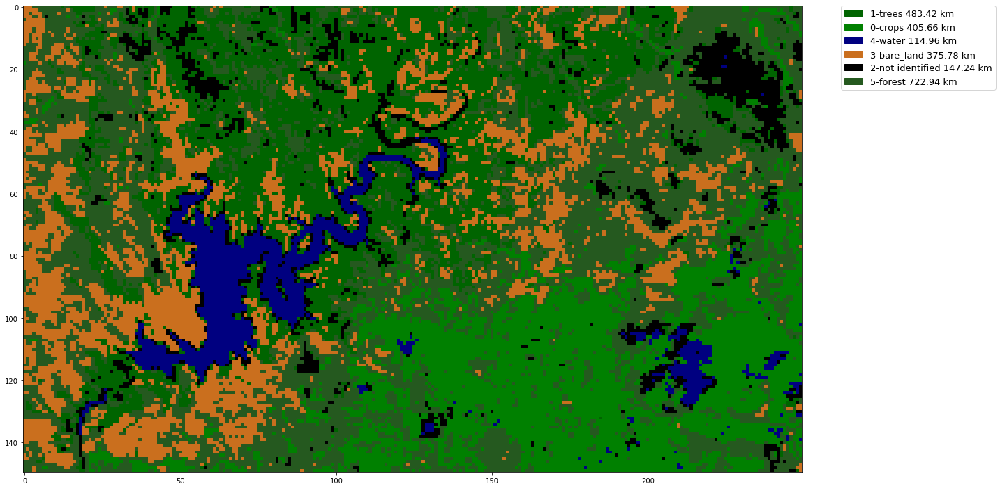

In [ ]:
import numpy as np

import earthpy.plot as ep
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

(unique, counts) = np.unique(pred, return_counts=True)
surface=(counts*60)/1000


cat_names = ["1-trees "+str(surface[0])+" km", "0-crops "+str(surface[1])+" km", "4-water "+str(surface[2])+" km", "3-bare_land "+str(surface[3])+" km", "2-not identified "+str(surface[4])+" km", "5-forest "+str(surface[5])+" km"]

f, ax = plt.subplots(figsize=(20,20))
im_ax = ax.imshow(pred.reshape((bands_arr1.shape[1], bands_arr1.shape[2])), cmap=ListedColormap(['darkgreen', 'green', 'navy', '#CA6F1E', 'black', '#25591f']))
#CA6F1E
leg_neg = ep.draw_legend(im_ax = im_ax, titles = cat_names)
plt.show()

---

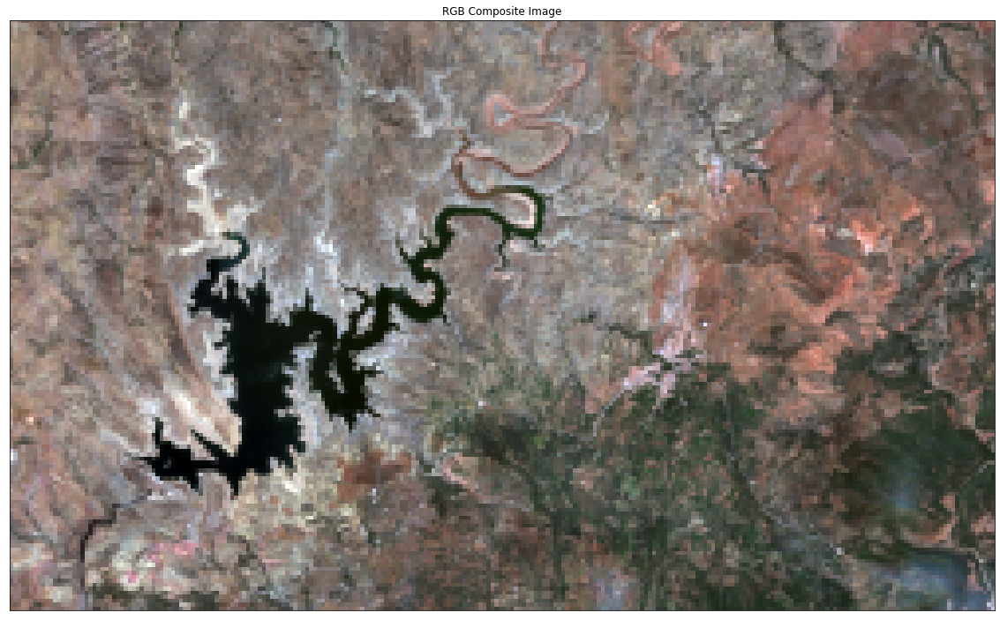

In [ ]:
ep.plot_rgb(
    bands_arr1,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(20, 20),
    title="RGB Composite Image",
)

plt.show()

---
---
---

# Crops identification 

## Introduction

### Dataset
In this study, Sentinel-2 satellite data has been used. 15 images were available from October 2020 to March 2021 with a cloud coverage of less than or equal to five percent covering the study area. The details of the available images are as follows: imegery dates for October (20201016, single image), November (20201105, 20201110, 20201115, 20201125, 20201130, 5 images), December (20201230, single image), January (20210109, single image), February (20210203, 20210208, 20210218, 20210223, 20210228, 5 images), March (20210305, 20210315, 2 images). We also have 577 ground truth points (GTPs) which have been collected by field visits from 22 February to 9 March 2021 which have been used as well. These GTPs include samples for all 7 crop types (Rice-175, Wheat-45, Potato-44, Maize-86, Mustard-23, Lentil-46, and Others-158) which we wanted to classify in this project.

### Method
In this study, GEE has been used to complete the task along with python API. The median image has been calculated for the study period during Oct-Mar. Median band reflectivity and vegetation indices (NDVI & EVI) for the total composite has been assessed here as well. 
Four experimental schemes:
1. VIS bands; 
2. VIS bands + NIR; 
3. VIS bands + VI Indices; 
4. VIS bands + NIR + VI Indices 
<br> have been tested using RF, ANN (MPL), SVM , XGBoosting and KNN machine learning algorithms. Finally, the model results have been evaluated using Accuracy Assessment and F-score indices. The best algorithm then has been used to classify final crop type map of the study area.

### Data Pre-processing

#### Sentinel-2 Data Preprocessing:
All the available 15 Sentinel-2 images have been used to derive a single band Median image for the six months during the study period (Oct. 2020-Mar. 2021). Here Sentinel-2 images have been processed using Google Earth Engine API, ee and geemap libraries. Using the Study area shapefile the respective median image has been derived, used and analyzed for further processing.

##### Installation of geemap
geemap is a Python package for interactive mapping with Google Earth Engine, ipyleaflet, and ipywidgets, which is a cloud computing platform with a multi-petabyte catalog of satellite imagery and geospatial datasets. geemap is intended for students and researchers, who would like to utilize the Python ecosystem of diverse libraries and tools to explore Google Earth Engine. It is also designed for existing GEE users who would like to transition from the GEE JavaScript API to Python API. The automated JavaScript-to-Python conversion module of the geemap package can greatly reduce the time needed to convert existing GEE JavaScripts to Python scripts and Jupyter notebooks.

For more details: https://geemap.org/ 

In [ ]:
!pip install geemap
!pip install -U geemap
!pip install geopandas
!pip install rasterio
%pip install earthpy


Installing the development version from GitHub directly within Jupyter notebook without using Git:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import geemap
geemap.update_package()

##### Import libraries

In [ ]:
import ee
import geemap
import geopandas as gpd


In [ ]:
ee.Authenticate()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=DVGjlvg0H3_hxPWJBzxg-N6CHR0yv9F9i06rIwDwbEs&tc=lMsC8BzSwvrX97SED8ukNa3VsFePgIAtOTCz2m7YtT4&cc=u9FO-3g7Zbmg6KMJDcV0-ubCicpmYD-TCV_4-eEfMfI

The authorization workflow will generate a code, which you should paste in the box below. 
Enter verification code: 4/1AX4XfWjrq1fko6Qqf_N8T4F-SemtFH4q-jCSNEvDb-qNuo4azicpNuCFNvk

Successfully saved authorization token.


##### Initialize the Earth Engine library

In [ ]:
try:
  ee.Initialize()
  print('Google Earth Engine has initialized successfully!')
except ee.EEException as e:
  print('Google Earth Engine has failed to initialize!')
except:
    print("Unexpected error:", sys.exc_info()[0])
    raise

Google Earth Engine has initialized successfully!


##### Creating an interactive map

In [ ]:
Map = geemap.Map(center=(24.478, 88.43), zoom=11) # Set your study areacoordinates as center and change the zoom value for better visualization
Map

Map(center=[24.478, 88.43], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(childr…

##### Add Study area shapefile from your directory

In [ ]:
roi = ee.FeatureCollection("projects/ee-khadijabouzzite/assets/RefData") # Read your Study area shape here from uploaded GEE Asset
aoi = roi.geometry()       # Convert Feature Collecion to Geometry as String


##### Add Earth Engine data and filter as per need

In [ ]:
# Monthly dataset collection
dataset = ee.ImageCollection("COPERNICUS/S2_SR")\
            .filterDate('2020-10-01', '2021-03-31')\
            .filterBounds(roi)\
            .filter('CLOUDY_PIXEL_PERCENTAGE <= 5')

##### Check the Image List

In [ ]:
listOfImages = dataset.aggregate_array('system:index').getInfo()
print('Number of images in the collection: ', len(listOfImages))

listOfImages

Number of images in the collection:  33


['20201016T043801_20201016T044709_T45RXH',
 '20201105T044001_20201105T044932_T45QXG',
 '20201105T044001_20201105T044932_T45RXH',
 '20201110T044019_20201110T044603_T45QXG',
 '20201110T044019_20201110T044603_T45RXH',
 '20201115T044051_20201115T044045_T45QXG',
 '20201115T044051_20201115T044045_T45RXH',
 '20201125T044121_20201125T044124_T45RXH',
 '20201130T044139_20201130T044138_T45QXG',
 '20201130T044139_20201130T044138_T45RXH',
 '20201215T044211_20201215T044207_T45QXG',
 '20201220T044209_20201220T044209_T45QXG',
 '20201230T044209_20201230T044924_T45QXG',
 '20201230T044209_20201230T044924_T45RXH',
 '20210109T044149_20210109T044908_T45QXG',
 '20210109T044149_20210109T044908_T45RXH',
 '20210203T044011_20210203T045035_T45QXG',
 '20210203T044011_20210203T045035_T45RXH',
 '20210208T043939_20210208T044440_T45QXG',
 '20210208T043939_20210208T044440_T45RXH',
 '20210218T043829_20210218T044429_T45QXG',
 '20210218T043829_20210218T044429_T45RXH',
 '20210223T043801_20210223T044723_T45QXG',
 '20210223T

##### Set visualization parameters

In [ ]:
rgb_vis = {'min':0, 'max':3000, 'bands':['B4','B3','B2']}
ndvi_colorizedVis = {"min":0,"max":1,"palette":["FFFFFF","CE7E45","DF923D", \
                    "F1B555","FCD163","99B718","74A901","66A000","529400","3E8601",\
                    "207401","056201","004C00","023B01","012E01","011D01","011301"]}

# Oct-Mar Median Image Calculation
### Reduces an image collection by calculating the median of all values at each pixel across the stack of all matching bands. Bands are matched by name.

In [ ]:
oct_mar_med = dataset.median().select('B2','B3','B4','B8','B5','B6','B7','B8A','B11','B12').clip(roi)
oct_mar_med

##### Visualizing median image (optional)

In [ ]:
Map.addLayer(aoi)
Map.centerObject(aoi, 11)
Map.addLayer(oct_mar_med, rgb_vis, 'oct_median')
Map

Map(center=[24.462029090186643, 88.38602104206245], controls=(WidgetControl(options=['position', 'transparent_…

### Reflectance Band Calculation
Convert band values to reflectance values

In [ ]:
oct_mar_ref = oct_mar_med.divide(10000)

### Indices Calculation

##### NDVI Calculation

In [ ]:
oct_mar_ndvi = oct_mar_med.normalizedDifference(['B8', 'B4']).rename('ndvi').toDouble()

##### EVI Calculation

In [ ]:
oct_mar_evi = oct_mar_med.expression('2.5*((NIR-R)/(NIR+6*R+1-7.5*B))',{
                                        'NIR':oct_mar_med.select('B8'),
                                        'R':oct_mar_med.select('B4'),
                                        'B':oct_mar_med.select('B2')})\
                                        .rename('evi')

### Final Composite Layer Derivation

In [ ]:
oct_mar_comp = oct_mar_ref.addBands(oct_mar_ndvi).addBands(oct_mar_evi)

##### Output Investigation

In [ ]:
# Get information about the bands as a list. 
bandNames = oct_mar_comp.bandNames() 
print('Band Names: ', bandNames.getInfo()) # ee.List of band names 

Band Names:  ['B2', 'B3', 'B4', 'B8', 'B5', 'B6', 'B7', 'B8A', 'B11', 'B12', 'ndvi', 'evi']


# Reference Data Processing and Analysis
Reference data have been processed here in two different ways. 
Firstly, we have prepared our data outside of this environment in ArcGIS so that reference dataset can be utilized in a better way. We have clipped the composite median image using sample polygons generated from point GPS values by manual digitization based on field experiences. The clipped pixels then converted again into sample points for 10 meter scale resolution. Now, the sample points cover 40784 pixels (Rice-10950, Wheat-786, Potato-5967, Maize-2806, Mustard-208, Lentil-482, and Others-19585). Finally the processed sample point shapefile has been exported into .csv file format and analyzed below:   

---

---

In [ ]:
data=gpd.read_file("/content/drive/MyDrive/crope type/shape_files/RefData.shp")


In [ ]:
'''data["FID"]=data.index'''
data.drop(["geometry"],axis=1,inplace=True)
data


,pointid,grid_code,Type,Value,B2,B3,B4,B8,B5,B6,B7,B8A,B11,B12,NDVI,EVI
0,312,0.08075,Rice,1,0.0666,0.0850,0.0897,0.1554,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.268054,0.845778
1,313,0.08070,Rice,1,0.0660,0.0830,0.0915,0.1724,0.1120,0.1379,0.1514,0.1694,0.1616,0.0926,0.306556,0.892936
2,314,0.08075,Rice,1,0.0662,0.0852,0.0902,0.1665,0.1120,0.1379,0.1514,0.1694,0.1616,0.0926,0.297234,0.902745
3,315,0.08085,Rice,1,0.0672,0.0851,0.0910,0.1681,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.297569,0.916984
4,316,0.08145,Rice,1,0.0653,0.0865,0.0926,0.1654,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.282171,0.786687
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40779,1,0.08450,Others,7,0.0680,0.1009,0.1052,0.2412,0.1474,0.2281,0.2416,0.2637,0.2432,0.1845,0.392610,0.937931
40780,2,0.08470,Others,7,0.0691,0.0973,0.1028,0.2518,0.1424,0.2177,0.2327,0.2562,0.2372,0.1612,0.420192,1.062919
40781,3,0.08540,Others,7,0.0745,0.0984,0.1040,0.2404,0.1572,0.2124,0.2289,0.2480,0.2583,0.2017,0.396051,1.115290
40782,4,0.08735,Others,7,0.0708,0.1003,0.1058,0.2436,0.1426,0.2086,0.2310,0.2491,0.2522,0.1849,0.394390,0.991367


##### Read the CSV data Sample data    not necessary we need only shape file 

---

In [ ]:
#No. of observation by crop type (Class)
data['Type'].value_counts().sort_values()

Mustard      208
Lentil       482
Wheat        786
Maize       2806
Potato      5967
Rice       10950
Others     19585
Name: Type, dtype: int64

### Crop specific spectral response has been analyzed below:

In [ ]:
# Descriptive statistics of the spectral values and VIs
data1=data.drop(['Value','NDVI','EVI','pointid', 'grid_code'], axis=1) # Drop Value column
me_spec=data1.groupby(['Type']).mean()
me_spec_t=me_spec.transpose()
me_spec_t

Type,Lentil,Maize,Mustard,Others,Potato,Rice,Wheat
B2,0.083534,0.077572,0.079573,0.096671,0.078404,0.077699,0.066113
B3,0.111863,0.096939,0.108807,0.125035,0.107411,0.104933,0.088976
B4,0.124080,0.081127,0.107191,0.114570,0.096299,0.100092,0.079622
B8,0.262024,0.260879,0.271557,0.121021,0.312261,0.231420,0.267996
B5,0.165522,0.112621,0.160313,0.126355,0.153658,0.142223,0.123366
B6,0.226557,0.205998,0.231341,0.116221,0.259868,0.202418,0.217591
B7,0.249095,0.253787,0.259280,0.121744,0.300461,0.221817,0.255961
B8A,0.269411,0.266923,0.279192,0.118926,0.327353,0.238328,0.276281
B11,0.254620,0.170973,0.216983,0.125592,0.226354,0.179965,0.185085
B12,0.183351,0.096306,0.141231,0.112544,0.139435,0.103225,0.112439


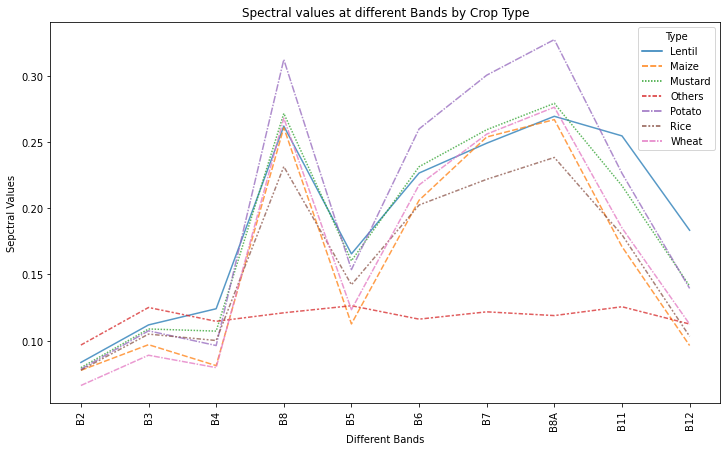

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

plt.figure(figsize=(12,7))
sns.lineplot(data=me_spec_t, alpha=0.75)
plt.title("Spectral values at different Bands by Crop Type")
plt.xlabel("Different Bands")
plt.ylabel("Sepctral Values")
plt.xticks(rotation=90)

# plt.tight_layout()
plt.show()

### Response of different crop types are:

In [ ]:
# Descriptive statistics of the spectral values and VIs
data2=data.drop(['Value', 'B2', 'B3', 'B4', 'B8', 'B5', 'B6', 'B7', 'B8A', 'B11', 'B12',  'pointid', 'grid_code'], axis=1) # Drop Value column
me_spec=data2.groupby(['Type']).mean()
me_spec_t=me_spec
me_spec_t

,NDVI,EVI
Type,,
Lentil,0.357680,0.946214
Maize,0.525370,2.906864
Mustard,0.432894,1.350845
Others,-0.101686,0.820563
Potato,0.527948,1.908365
Rice,0.390974,1.400188
Wheat,0.540792,1.952659


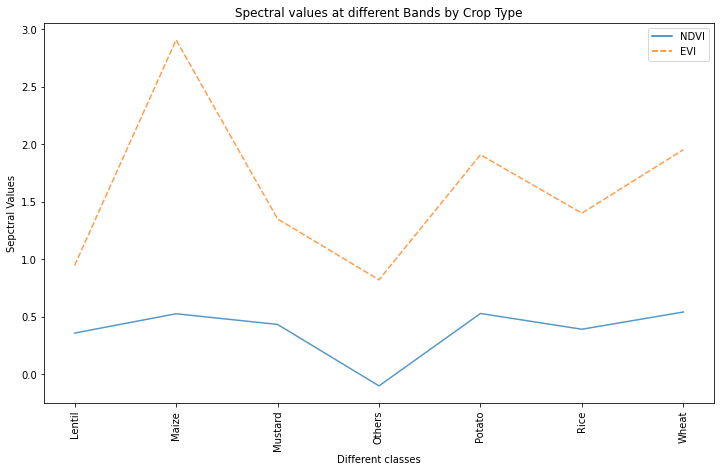

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

plt.figure(figsize=(12,7))
sns.lineplot(data=me_spec_t, alpha=0.75)
plt.title("Spectral values at different Bands by Crop Type")
plt.xlabel("Different classes")
plt.ylabel("Sepctral Values")
plt.xticks(rotation=90)

# plt.tight_layout()
plt.show()

# Model Development 

### Import Necessary Libraries

In [ ]:
# linear algebra
import numpy as np
# data processing
import pandas as pd
# data visualization (Graphs are designed by this library)
import seaborn as sns
%matplotlib inline 
from matplotlib import pyplot as plt

from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Algorithms
from sklearn.ensemble import GradientBoostingClassifier

#Accuracy
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix
from sklearn.inspection import permutation_importance
from sklearn import metrics
from sklearn.metrics import f1_score

# Model Scheme

# Variable Declaration

In [ ]:
data

,pointid,grid_code,Type,Value,B2,B3,B4,B8,B5,B6,B7,B8A,B11,B12,NDVI,EVI
0,312,0.08075,Rice,1,0.0666,0.0850,0.0897,0.1554,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.268054,0.845778
1,313,0.08070,Rice,1,0.0660,0.0830,0.0915,0.1724,0.1120,0.1379,0.1514,0.1694,0.1616,0.0926,0.306556,0.892936
2,314,0.08075,Rice,1,0.0662,0.0852,0.0902,0.1665,0.1120,0.1379,0.1514,0.1694,0.1616,0.0926,0.297234,0.902745
3,315,0.08085,Rice,1,0.0672,0.0851,0.0910,0.1681,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.297569,0.916984
4,316,0.08145,Rice,1,0.0653,0.0865,0.0926,0.1654,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.282171,0.786687
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40779,1,0.08450,Others,7,0.0680,0.1009,0.1052,0.2412,0.1474,0.2281,0.2416,0.2637,0.2432,0.1845,0.392610,0.937931
40780,2,0.08470,Others,7,0.0691,0.0973,0.1028,0.2518,0.1424,0.2177,0.2327,0.2562,0.2372,0.1612,0.420192,1.062919
40781,3,0.08540,Others,7,0.0745,0.0984,0.1040,0.2404,0.1572,0.2124,0.2289,0.2480,0.2583,0.2017,0.396051,1.115290
40782,4,0.08735,Others,7,0.0708,0.1003,0.1058,0.2436,0.1426,0.2086,0.2310,0.2491,0.2522,0.1849,0.394390,0.991367


In [ ]:
df_model = pd.get_dummies(data[['pointid', 'grid_code', 'Type', 'Value', 'B2', 'B3', 'B4', 'B8', 'B5', 'B6', 'B7', 'B8A', 'B11', 'B12', 'NDVI', 'EVI']])
# df_model.tail()
df_model.drop(columns=['pointid', 'grid_code'],inplace=True)
# df_model.tail()
y = df_model.pop('Value')

df_model = df_model.loc[:, ['B2', 'B3', 'B4', 'B8','NDVI', 'EVI']] #Model_Scheme (RGB + NIR Bands + Indices)
X = df_model
X.columns

Index(['B2', 'B3', 'B4', 'B8', 'NDVI', 'EVI'], dtype='object')

# Test-Train Splitting

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.30, random_state=42)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

scaler = StandardScaler() #scaler = MinMaxScaler(feature_range=(0, 1))
scaler.fit(X_train)

X_train = scaler.transform(X_train)
X_test= scaler.transform(X_test)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((28548, 6), (12236, 6), (28548,), (12236,))

# RF

In [ ]:
param_grid = {
                 'n_estimators': [ 50,60,70],
                 'max_depth': [ 15,20]
             }

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=50) # Try with different number of estimators
rf = rf.fit(X_train, y_train.values.ravel())

# Prediction Using Random Forest Classifier
from sklearn.metrics import accuracy_score, confusion_matrix

Y_pred_rf = rf.predict(X_test)

Class_Acc_RF4 = accuracy_score(y_test, Y_pred_rf)*100
print(Class_Acc_RF4)
# print("Classification accuracy of RF is", Class_Acc_RF)
print(classification_report(y_test, Y_pred_rf))

93.34749918273945
              precision    recall  f1-score   support

           1       0.88      0.93      0.91      3335
           2       0.74      0.66      0.70       210
           3       0.92      0.93      0.92      1748
           4       0.86      0.85      0.85       808
           5       0.71      0.16      0.26        62
           6       0.68      0.35      0.47       153
           7       0.99      0.98      0.98      5920

    accuracy                           0.93     12236
   macro avg       0.83      0.69      0.73     12236
weighted avg       0.93      0.93      0.93     12236



In [ ]:
from sklearn.model_selection import GridSearchCV
clf = RandomForestClassifier()
grid_clf = GridSearchCV(clf, param_grid, cv=5)
grid_clf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [15, 20], 'n_estimators': [50, 60, 70]})

In [ ]:
grid_clf. best_params_

{'max_depth': 20, 'n_estimators': 60}

## save the module

In [ ]:
best_estimator =grid_clf. best_estimator_
import pickle
pickle.dump(best_estimator, open("/content/drive/MyDrive/crope type/best_estimatorCroptyp.dat", 'wb'))

# prediction

### import the module

In [ ]:
import pickle
best_estimator = pickle.load(open("/content/drive/MyDrive/crope type/best_estimatorCroptyp.dat", 'rb'))

In [ ]:
from glob import glob
import rasterio as rio
import os

# Data Directory

os.chdir('/content/drive/MyDrive/crope type/Rajshahi')

# Read bands
sentinel_bands = glob("*.jp2")
sentinel_bands.sort()

# Composite the bands
bands_arr = []
for i in sentinel_bands:
  with rio.open(i, 'r') as f:
    g=f.read(1)
    bands_arr.append(g)
    print(i,"has shape",g.shape)
    # Data as array


T45RXH_20220310T043711_B02.jp2 has shape (10980, 10980)
T45RXH_20220310T043711_B03.jp2 has shape (10980, 10980)
T45RXH_20220310T043711_B04.jp2 has shape (10980, 10980)
T45RXH_20220310T043711_B08.jp2 has shape (10980, 10980)


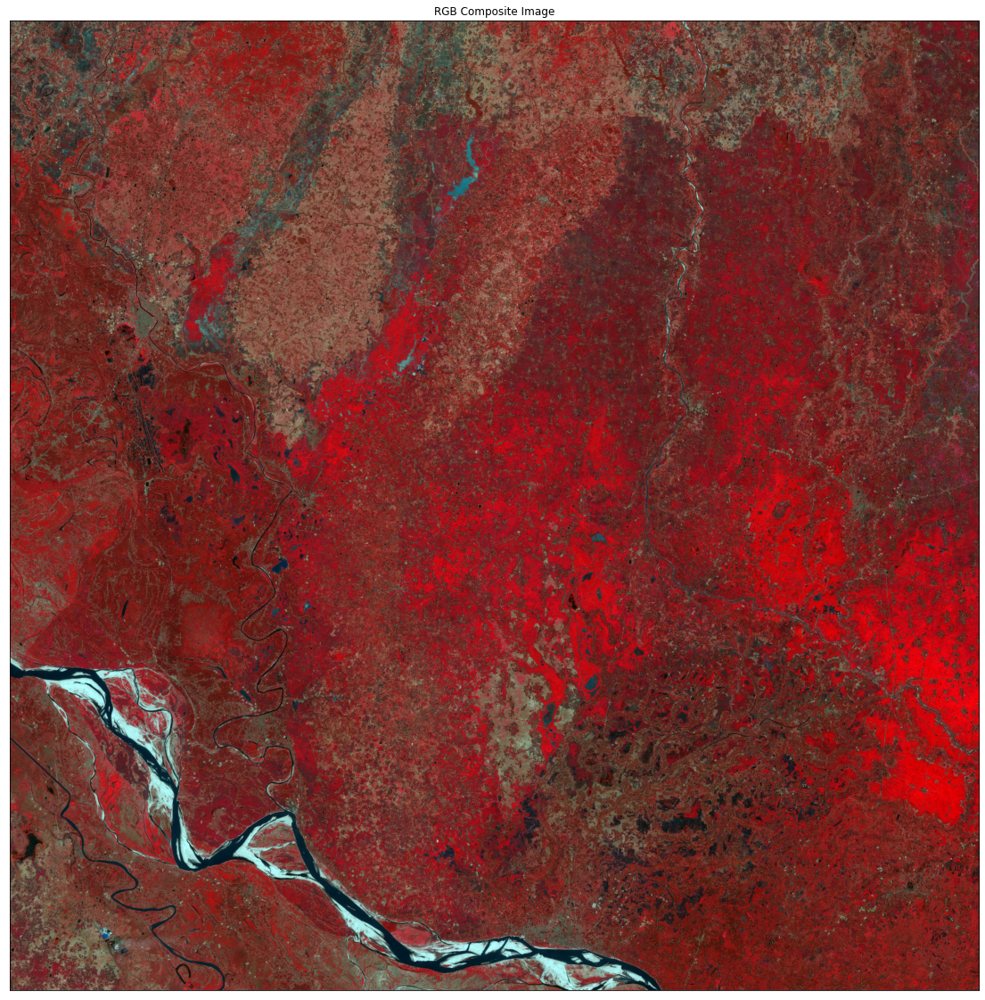

In [ ]:
import numpy as np
import earthpy.plot as ep

bands_arr1 = np.stack(bands_arr)
bands_arr1.shape

ep.plot_rgb(
    bands_arr1,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(20, 20),
    title="RGB Composite Image",
)

plt.show()

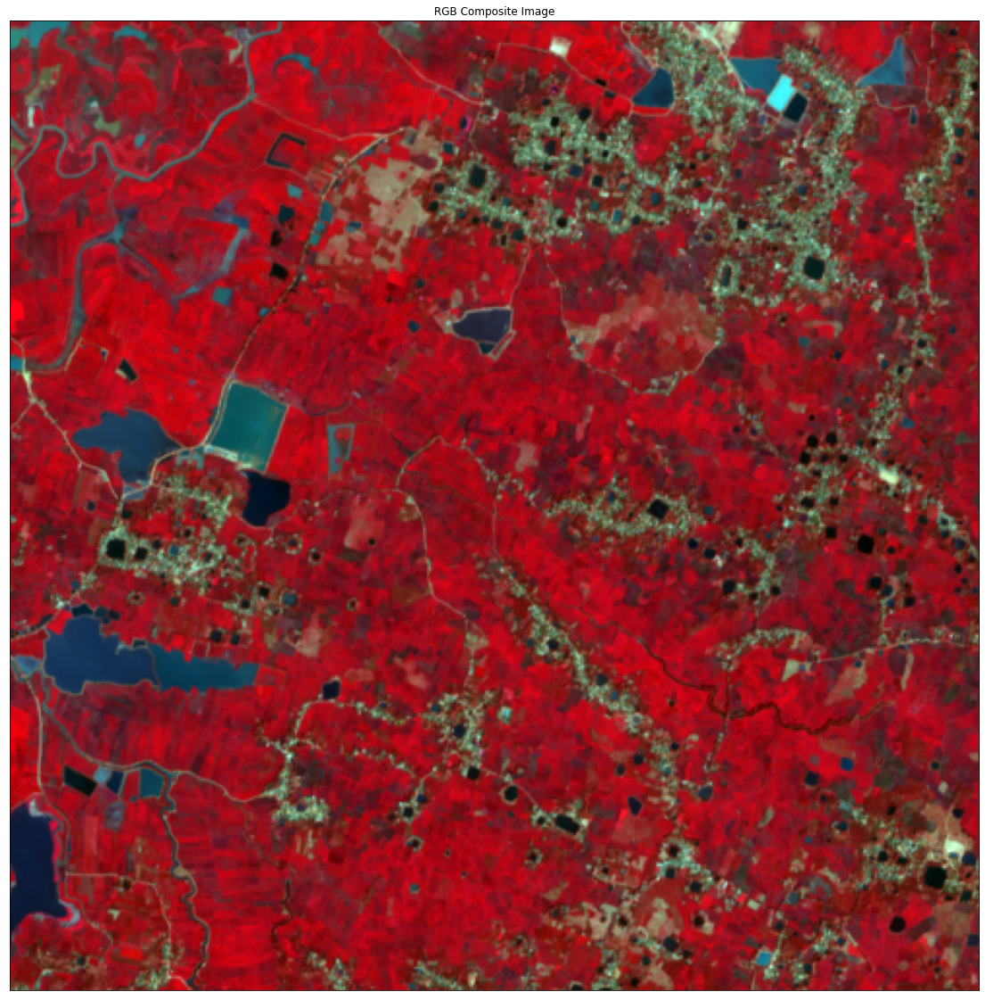

In [ ]:
bands_arr=np.array(bands_arr)
list2=[]

for i in bands_arr:
  list2.append(i[:][:,4000:4500])

np.shape(list2)

bands_arr1=np.array(list2)

bands_arr1=bands_arr1[:][:,4000:4500]
bands_arr1.shape

bands_arr1 = np.stack(bands_arr1)
bands_arr1.shape

ep.plot_rgb(
    bands_arr1,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(20, 20),
    title="RGB Composite Image",
)

plt.show()

In [ ]:
bands_arr1.shape

(4, 500, 500)

In [ ]:
x = np.moveaxis(bands_arr1, 0, -1)

X_data2 = x.reshape(-1, 4)
scaler2 = StandardScaler().fit(X_data2)
test = scaler2.transform(X_data2)

test.shape

(250000, 4)

# TESTING WITH OUR SATELLITE IMAGE

## preprocessing 

In [ ]:
bands=['B2', 'B3', 'B4', 'B8']

In [ ]:
import pandas as pd
test=pd.DataFrame(test,columns=bands)
test

,B2,B3,B4,B8
0,-0.015479,0.004261,-0.099533,0.254947
1,0.148262,0.061510,-0.148395,0.344148
2,-0.015479,-0.183844,-0.246117,0.358024
3,-0.066649,-0.192022,-0.343840,0.060687
4,-0.220157,-0.224736,-0.352724,0.009149
...,...,...,...,...
249995,-0.557874,-0.903549,-0.383817,-0.494341
249996,-0.506705,-0.780872,-0.392701,0.068616
249997,-0.793253,-0.887192,-0.543727,0.338202
249998,-0.742084,-0.993513,-0.463772,0.136013


### Indices Calculation

##### NDVI Calculation

In [ ]:
test['ndvi']=(test['B8']-test['B4'])/test['B8']+test['B4']
test

,B2,B3,B4,B8,ndvi
0,-0.015479,0.004261,-0.099533,0.254947,1.290874
1,0.148262,0.061510,-0.148395,0.344148,1.282799
2,-0.015479,-0.183844,-0.246117,0.358024,1.441315
3,-0.066649,-0.192022,-0.343840,0.060687,6.321911
4,-0.220157,-0.224736,-0.352724,0.009149,39.200167
...,...,...,...,...,...
249995,-0.557874,-0.903549,-0.383817,-0.494341,-0.160240
249996,-0.506705,-0.780872,-0.392701,0.068616,6.330437
249997,-0.793253,-0.887192,-0.543727,0.338202,2.063974
249998,-0.742084,-0.993513,-0.463772,0.136013,3.945999


##### EVI Calculation

In [ ]:
test['evi']=2.5*((test['B8']-test['B4'])/(test['B8']+6*test['B4']+1-7.5*test['B2']))
test

,B2,B3,B4,B8,ndvi,evi
0,-0.015479,0.004261,-0.099533,0.254947,1.290874,1.145194
1,0.148262,0.061510,-0.148395,0.344148,1.282799,-1.870834
2,-0.015479,-0.183844,-0.246117,0.358024,1.441315,-584.613898
3,-0.066649,-0.192022,-0.343840,0.060687,6.321911,-2.012628
4,-0.220157,-0.224736,-0.352724,0.009149,39.200167,1.663076
...,...,...,...,...,...,...
249995,-0.557874,-0.903549,-0.383817,-0.494341,-0.160240,-0.115765
249996,-0.506705,-0.780872,-0.392701,0.068616,6.330437,0.458987
249997,-0.793253,-0.887192,-0.543727,0.338202,2.063974,0.547750
249998,-0.742084,-0.993513,-0.463772,0.136013,3.945999,0.382613


## prediction

In [ ]:
pred = best_estimator.predict(test)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


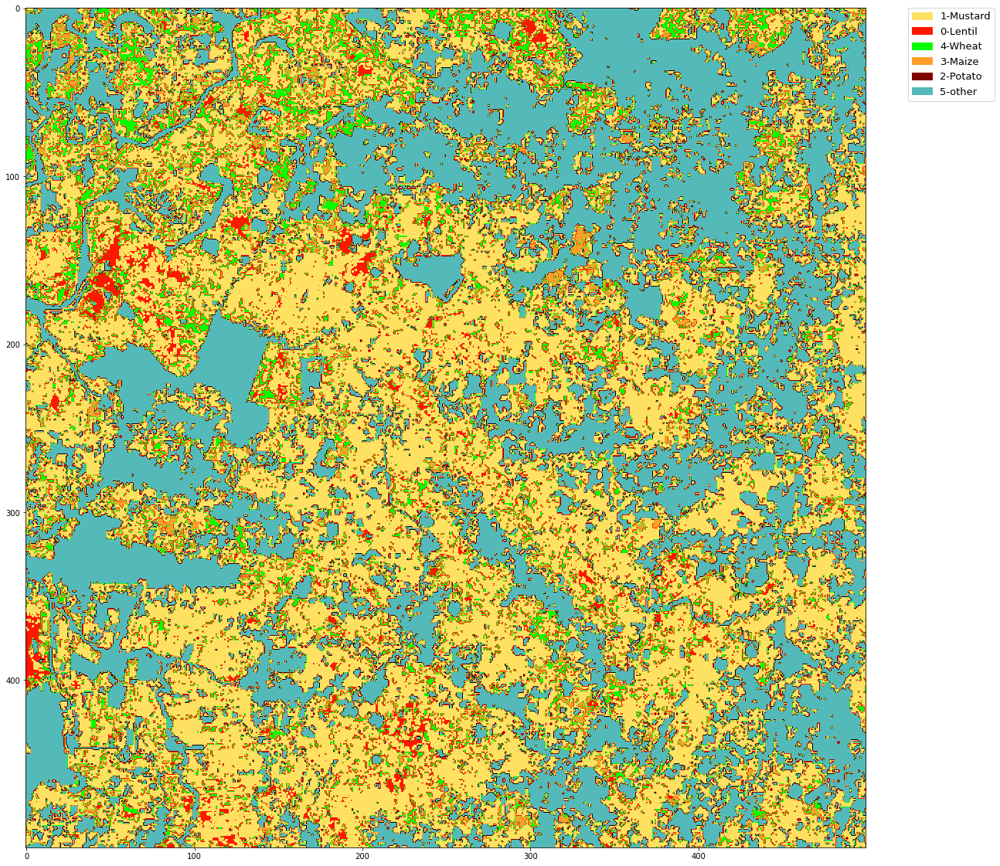

In [ ]:
import numpy as np

import earthpy.plot as ep
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap


cat_names = ["1-Mustard", "0-Lentil", "4-Wheat", "3-Maize", "2-Potato", "5-other"]

f, ax = plt.subplots(figsize=(20,20))
im_ax = ax.imshow(pred.reshape((bands_arr1.shape[1], bands_arr1.shape[2])), cmap=ListedColormap(['#FFE162', '#FF1700', '#06FF00', '#FF9F29', 'black', 'maroon','#54BAB9']))
#CA6F1E
leg_neg = ep.draw_legend(im_ax = im_ax, titles = cat_names)
plt.show()


  

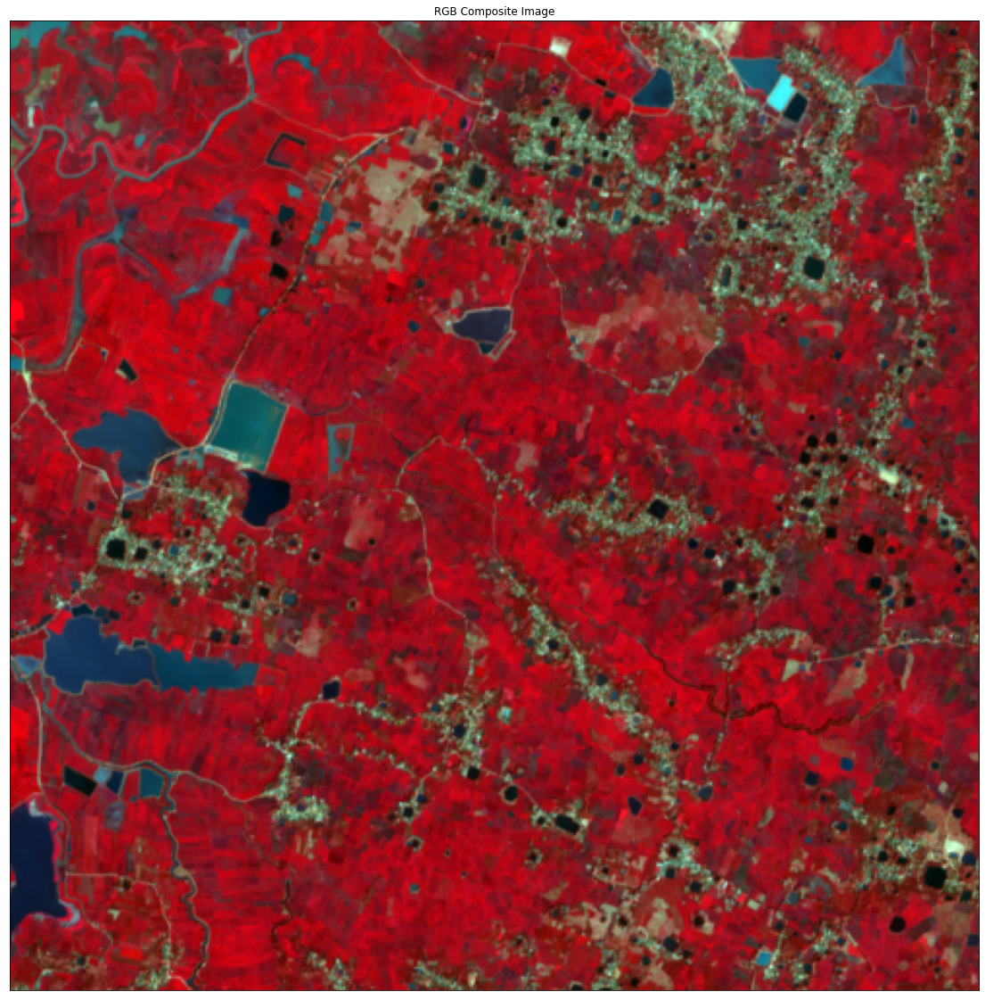

In [ ]:

ep.plot_rgb(
    bands_arr1,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(20, 20),
    title="RGB Composite Image",
)

plt.show()

---

---

### <font color='blue'>Reference</font>

1. LaGro Jr JA. Land-use classification. In: Hillel D, editor., Elsevier Publication; 2005, p. 321–8. https://doi.org/doi.org/10.1016/B0-12-348530-4/00530-0.
2. Ozdogan M, Yang Y, Allez G, Cervantes C. Remote sensing of irrigated agriculture: Opportunities and challenges. Remote Sens 2010;2:2274–304. https://doi.org/10.3390/rs2092274.
3. Al-Doski J, Mansor SB, San HP, Khuzaimah Z. Improved Land Cover Mapping Using Landsat 8 Thermal Imagery. IOP Conf. Ser. Earth Environ. Sci., 2020, p. 540(1). https://doi.org/10.1088/1755-1315/540/1/012022.
4. Abdi AM. Land cover and land use classification performance of machine learning algorithms in a boreal landscape using Sentinel-2 data. GIScience Remote Sens 2020;57:1–20. https://doi.org/10.1080/15481603.2019.1650447.
5. Kakarla S. Sundarbans data, Satellite Imagery Analysis 2021. https://github.com/syamkakarla98/Satellite_Imagery_Analysis/tree/main/Data/sundarbans_data (accessed October 31, 2021).
6. Yuan F, Sawaya KE, Loeffelholz BC, Bauer ME. Land cover classification and change analysis of the Twin Cities (Minnesota) metropolitan area by multitemporal Landsat remote sensing. Remote Sens Environ 2005;98:317–28. https://doi.org/10.1016/j.rse.2005.08.006.

#### <font color='blue'>Data Source</font>
1. https://github.com/syamkakarla98/Satellite_Imagery_Analysis/tree/main/Data/sundarbans_data

The study area shapefile can be accesses on:
https://code.earthengine.google.com/?asset=users%2Fshohelovro%2FCropTypePaper%2FGodagari_Upazila&fbclid=IwAR0yP7K6kvB9vsP6GJ7E8SR3wyFAOA6_ab4frGGrHEGRAAu36D5kFt8qbxk

The composite image can be accessed on:
https://drive.google.com/file/d/1KywwGYj1oVxrzyKH6322IE7olfXImT4D/view?fbclid=IwAR3saSt8WEvGpck_4yk-84mv3dqz-L7XjYZ3n-iuYcvDm7oAQKzF4jokY6E

## END